<a href="https://colab.research.google.com/github/Foluwa/transfer_learning_keras/blob/main/Group_14_Transfer_Learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Deep Learning submission for group 14

##### Akintola Moronfoluwa

In this project we:

* We selected ResNet, Efficientnet and built a custom CNN.
* Highlight the fine-tuning process: Discuss which layers you decided to freeze/unfreeze and why.
* Discuss the results: Compare the results of using transfer learning vs. training a model from scratch for the same task.
* Consider potential implications: Delve into the benefits, potential pitfalls, and ethical implications of using transfer learning in image classification.


#### Install required libraries

In [1]:
!pip install visualkeras

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 993.8/993.8 kB 16.0 MB/s eta 0:00:00


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!unzip drive/MyDrive/Archive.zip

Streaming output truncated to the last 5000 lines.
  inflating: seg_train/seg_train/mountain/16164.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._16164.jpg  
  inflating: seg_train/seg_train/mountain/3358.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._3358.jpg  
  inflating: seg_train/seg_train/mountain/2720.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._2720.jpg  
  inflating: seg_train/seg_train/mountain/14029.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._14029.jpg  
  inflating: seg_train/seg_train/mountain/14997.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._14997.jpg  
  inflating: seg_train/seg_train/mountain/1567.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._1567.jpg  
  inflating: seg_train/seg_train/mountain/11637.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._11637.jpg  
  inflating: seg_train/seg_train/mountain/15445.jpg  
  inflating: __MACOSX/seg_train/seg_train/mountain/._15445.jpg  
  i

In [4]:
import os
import cv2
import time
import random
import datetime
import itertools
import visualkeras
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from sklearn.utils import shuffle
from sklearn.metrics import confusion_matrix, classification_report

from tensorflow.keras import Model
from tensorflow.keras.utils import plot_model
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras import datasets, layers, models
from tensorflow.keras.layers.experimental import preprocessing
from tensorflow.keras.applications import ResNet50, EfficientNetB0
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, Dropout, Flatten, Dense, LeakyReLU

plt.style.use('fivethirtyeight')
# os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

#### Constants

In [5]:
# Model Architecture
epochs = 20
img_width = img_height = 150
batch_size = 64 # 32
input_shape = (img_width, img_height, 3)
n_classes = 6
dimensions = (img_width, img_height)
input_shape = (img_width, img_height, 3)
image_size = (150, 150)

####  Define train and test datasets




In [6]:
train_folder = "./seg_train/seg_train/"
test_folder = "./seg_test/seg_test/"

# Generates batches of augmented images
datagen = ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    rotation_range=20,
    horizontal_flip=True
)

# Load the images from folder
train_data = datagen.flow_from_directory(
    train_folder,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

test_data = datagen.flow_from_directory(
    test_folder,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical'
)

test_data_1 = tf.keras.preprocessing.image_dataset_from_directory(test_folder,
                                                               image_size = (img_width, img_height),
                                                               label_mode = 'categorical',
                                                               batch_size = batch_size,
                                                               shuffle = False)

Found 14034 images belonging to 6 classes.
Found 3000 images belonging to 6 classes.
Found 3000 files belonging to 6 classes.



#### Utility functions

In [7]:
def split_images_and_labels(data, full_dataset=True):
    """
    Separate the images and the labels and return them.
    full_dataset=False, it will take 10000 images
    """
    images = []
    labels = []

    if full_dataset:
        dataset_size = len(data)
    else:
        dataset_size = 10000

    for i in range(dataset_size):
        batch_images, batch_labels = next(data)
        images.append(batch_images)
        labels.append(batch_labels)

    images = np.concatenate(images)
    labels = np.concatenate(labels)

    return images, labels

In [8]:
# Function to load and preprocess data from a given directory.
def load_and_preprocess_data(directory, image_size):
    data = []
    labels = []
    for category in os.listdir(directory):
        category_folder = os.path.join(directory, category)
        label = category
        # Iterate through each image in the category folder
        for image_name in os.listdir(category_folder):
            image_path = os.path.join(category_folder, image_name)
            image = tf.keras.preprocessing.image.load_img(image_path, target_size=image_size)
            # Convert the image to a numpy array
            image_array = tf.keras.preprocessing.image.img_to_array(image)
            image_array = image_array / 255.0
            data.append(image_array)
            labels.append(label)
    return np.array(data), np.array(labels)

In [9]:
def display_confusion_matrix(test_labels, predicted_labels):
    """
      Generate the confusion matrix
    """
    conf_matrix = confusion_matrix(test_labels, predicted_labels)

    # Plot the confusion matrix using a heatmap.
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
                xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
    plt.title('Confusion Matrix for ResNet Model')
    plt.ylabel('True Labels')
    plt.xlabel('Predicted Labels')
    return plt.show()

In [59]:
# def evaluate_model(history, model, model_name=''):

#     plt.figure(figsize=(12,5))

#     # Plot training and validation accuracy
#     plt.subplot(121)
#     plt.plot(history.history['accuracy'])
#     plt.plot(history.history['val_accuracy'])
#     plt.title('Model accuracy', fontsize=16)
#     plt.ylabel('Accuracy')
#     plt.xlabel('Epoch')
#     plt.legend(['Train', 'Validation'], loc='upper left')

#     # Plot training and validation loss
#     plt.subplot(122)
#     plt.plot(history.history['loss'])
#     plt.plot(history.history['val_loss'])
#     plt.title('Model loss', fontsize=16)
#     plt.ylabel('Loss')
#     plt.xlabel('Epoch')
#     plt.legend(['Train', 'Validation'], loc='upper left')
#     plt.suptitle(f'{model_name} Performance', fontsize=20)
#     return plt.show()

def evaluate_model(history, model, model_name=''):
    plt.figure(figsize=(12, 5))

    # Plot training and validation accuracy
    plt.subplot(121)
    plt.plot(history.history['accuracy'], color='blue', label='Train')
    plt.plot(history.history['val_accuracy'], color='orange', label='Validation')
    plt.title('Model Accuracy', fontsize=16, color='white')
    plt.ylabel('Accuracy', color='white')
    plt.xlabel('Epoch', color='white')
    plt.legend(loc='upper left', fontsize='large')
    plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')

    # Plot training and validation loss
    plt.subplot(122)
    plt.plot(history.history['loss'], color='blue', label='Train')
    plt.plot(history.history['val_loss'], color='orange', label='Validation')
    plt.title('Model Loss', fontsize=16, color='white')
    plt.ylabel('Loss', color='white')
    plt.xlabel('Epoch', color='white')
    plt.legend(loc='upper left', fontsize='large')
    plt.grid(True, color='gray', linestyle='--', linewidth=0.5)
    plt.tick_params(axis='x', colors='white')
    plt.tick_params(axis='y', colors='white')

    plt.suptitle(f'{model_name} Performance', fontsize=20, color='white')
    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust the layout to prevent clipping of the suptitle
    plt.savefig(f'{model_name}_performance.png', transparent=True)
    return plt.show()

In [11]:
def load_and_prep_image(filename, img_shape = 150, scale = True):
    """
      Create a function to load and prepare images
    """
    img = tf.io.read_file(filename)

    # Decode image into tensor
    img = tf.io.decode_image(img, channels = 3)

    # Resize the image
    img = tf.image.resize(img, size = [img_shape, img_shape])
    if scale:
        # rescale the image (get all values between 0 and 1)
        return img/255.
    else:
        # don't need to rescale images for EfficientNet models in TensorFlow
        return img

In [12]:
# def plot_loss_curves(history):
#     plt.plot(history.history["loss"], label="training_loss")
#     plt.plot(history.history["val_loss"], label="val_loss")
#     plt.title("Loss")
#     plt.xlabel("Epochs")
#     plt.legend()

#     plt.figure()
#     plt.plot(history.history["accuracy"], label="training_accuracy")
#     plt.plot(history.history["val_accuracy"], label="val_accuracy")
#     plt.title("Accuracy")
#     plt.xlabel("Epochs")
#     return plt.legend()

In [13]:
def load_data():
    """
        Load the data:
            - 14,034 images to train the network.
            - 3,000 images to evaluate how accurately the network learned to classify images.
    """

    datasets = ['./seg_train/seg_train', './seg_test/seg_test']
    output = []

    # Iterate through training and test sets
    for dataset in datasets:

        images = []
        labels = []

        print("Loading {}".format(dataset))

        # Iterate through each folder corresponding to a category
        for folder in os.listdir(dataset):
            label = class_names_label[folder]

            # Iterate through each image in our folder
            for file in tqdm(os.listdir(os.path.join(dataset, folder))):

                # Get the path name of the image
                img_path = os.path.join(os.path.join(dataset, folder), file)

                # Open and resize the img
                image = cv2.imread(img_path)
                image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
                image = cv2.resize(image, image_size)

                # Append the image and its corresponding label to the output
                images.append(image)
                labels.append(label)

        images = np.array(images, dtype = 'float32')
        labels = np.array(labels, dtype = 'int32')

        output.append((images, labels))

    return output

In [14]:
def plot_loss_curves(history):
    """
      Define a function to plot loss curves
    """
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    accuracy = history.history['accuracy']
    val_accuracy = history.history['val_accuracy']

    epochs = range(len(history.history['loss']))

    # Plot loss
    plt.figure(figsize = (15, 6))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, label='training_loss')
    plt.plot(epochs, val_loss, label='val_loss')
    plt.title('Training Loss vs Validation Loss')
    plt.xlabel('Epochs')
    plt.legend()

    # Plot accuracy
    plt.subplot(1, 2, 2)
    plt.plot(epochs, accuracy, label='training_accuracy')
    plt.plot(epochs, val_accuracy, label='val_accuracy')
    plt.title('Training Accuracy vs Validation Accuracy')
    plt.xlabel('Epochs')
    return plt.legend();

#### Extract the pre-defined classes

In [15]:
# Get class names
classes = list(train_data.class_indices.keys())

# Print the class names
print(classes)

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']


In [16]:
# Convert label to index
label_to_index = {label: index for index, label in enumerate(classes)}

In [17]:
# Convert numerical labels back to class names
index_to_label = {index: label for label, index in label_to_index.items()}

Plot Sample Images

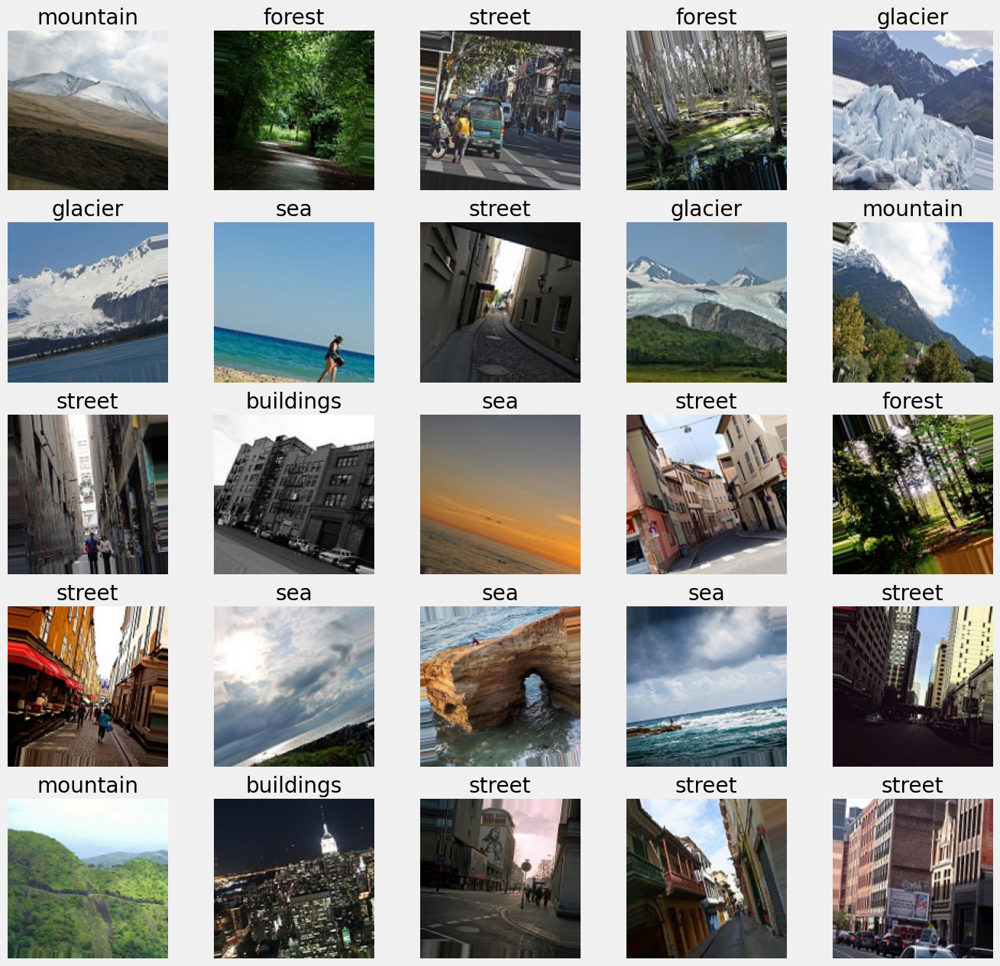

In [18]:
images, labels = next(train_data)

# Plot the first few images and their labels
fig, axes = plt.subplots(nrows=5, ncols=5, figsize=(15, 15))
for i, ax in enumerate(axes.flat):
    ax.imshow(images[i])
    label_index = np.argmax(labels[i])
    ax.set_title(classes[label_index])
    ax.axis('off')

plt.show()

In [19]:
# Load Train and Test data (CNN)
train_images, train_labels = split_images_and_labels(train_data)
test_images, test_labels = split_images_and_labels(test_data)

(-0.5, 149.5, 149.5, -0.5)

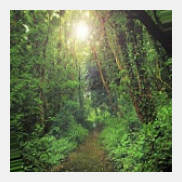

In [20]:
plt.figure(figsize=(2,2))
plt.imshow(test_images[0])
plt.axis('off')

In [21]:
print(f"Training set: {len(train_images)} images and {len(train_labels)} labels")
print(f"Test set: {len(test_images)} images and {len(test_labels)} labels")
print(f"Train images shape: {train_images.shape} - Test images shape: {test_images.shape}")
print(f"The {train_labels.shape[1]} classes are represented as one-hot vectors of shape {train_labels.shape}")

Training set: 14034 images and 14034 labels
Test set: 3000 images and 3000 labels
Train images shape: (14034, 150, 150, 3) - Test images shape: (3000, 150, 150, 3)
The 6 classes are represented as one-hot vectors of shape (14034, 6)


In [22]:
class_names_label = {class_name:i for i, class_name in enumerate(classes)}

### Explore the dataset

In [23]:
(train_images_, train_labels_), (test_images_, test_labels_) = load_data()
_, train_counts = np.unique(train_labels_, return_counts=True)
_, test_counts = np.unique(test_labels_, return_counts=True)

Loading ./seg_train/seg_train


100%|██████████| 2512/2512 [00:01<00:00, 2157.61it/s]


Loading ./seg_test/seg_test


100%|██████████| 525/525 [00:00<00:00, 2285.29it/s]


In [24]:
print(train_images.shape)
print(test_images.shape)
print(train_labels.shape)
print(test_labels.shape)

(14034, 150, 150, 3)
(3000, 150, 150, 3)
(14034, 6)
(3000, 6)


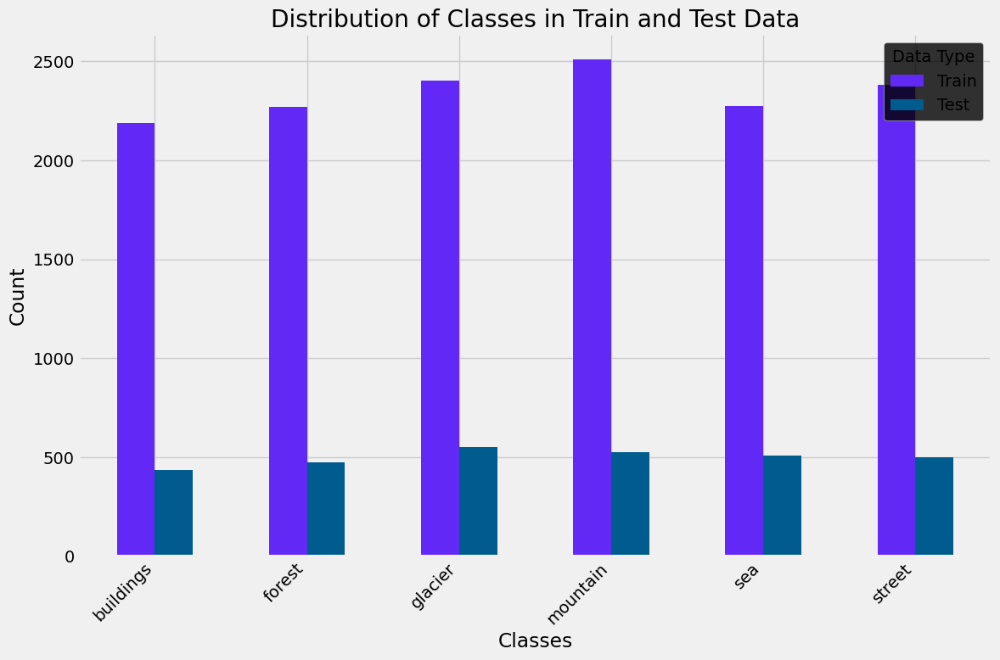

In [25]:
# Create DataFrame
df_distribution = pd.DataFrame({'Train': train_counts, 'Test': test_counts}, index=classes)

# Set color codes
colors = ['#6128f6', '#005c8f']

chart_text_color = '#000' #white

# Plot
ax = df_distribution.plot(kind='bar', figsize=(12, 8), color=colors)
ax.set_ylabel('Count', color=chart_text_color)
ax.set_xlabel('Classes', color=chart_text_color)
ax.set_title('Distribution of Classes in Train and Test Data', color=chart_text_color)
ax.legend(title='Data Type', loc='upper right', facecolor=chart_text_color)
plt.xticks(rotation=45, ha='right', color=chart_text_color)
plt.yticks(color=chart_text_color)
plt.tight_layout()

# Save as transparent PNG file
# plt.savefig('distribution_plot.png', transparent=True)

plt.show()

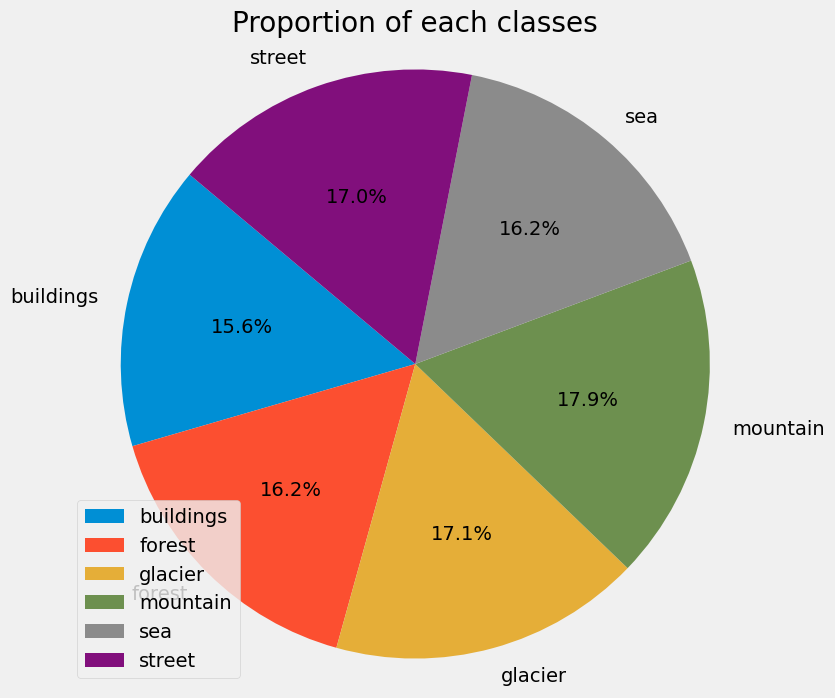

In [26]:
plt.figure(figsize=(8, 8))

# Plot the pie chart
patches, texts, autotexts = plt.pie(train_counts,
                                    explode=(0, 0, 0, 0, 0, 0),
                                    labels=classes,
                                    autopct='%1.1f%%',
                                    startangle=140)

# Add legend
plt.legend(patches, classes, loc="best")

# Set aspect ratio to be equal to ensure circular shape
plt.axis('equal')

# Add title
plt.title('Proportion of each classes')

# Show the plot
plt.show()

<h1 id="ergdfffggs" style="color:white;background:#0087B6;padding:8px;border-radius:8px"> What is transfer learning ? </h1>

A pre-trained model is a previously trained and saved neural network that has learned from a massive dataset. This pre-trained model can either be utilized as it is or customized through transfer learning techniques to adapt it to the specific task at hand. The underlying idea behind transfer learning for image classification is that if a model is trained on a sufficiently large and diverse dataset, it will effectively learn generalizable representations of the visual world. By leveraging these learned feature maps, you can avoid starting from scratch and instead build upon the existing knowledge of the pre-trained model, fine-tuning it for your particular image classification objective without the need to train an entirely new large model on a massive dataset from the ground up.

# Neural Networks

### 1.  Convolutional Neural Network (CNN)

Convolutional neural network (CNN) is a regularized type of feed-forward neural network that learns feature engineering by itself via filters (or kernel) optimization. Vanishing gradients and exploding gradients, seen during backpropagation in earlier neural networks, are prevented by using regularized weights over fewer connections.

In [27]:
# Define the model
cnn_model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=input_shape),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(256, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Flatten(),
    Dense(128, activation='relu'),
    Dense(n_classes, activation='softmax')
])

Display CNN model architecture

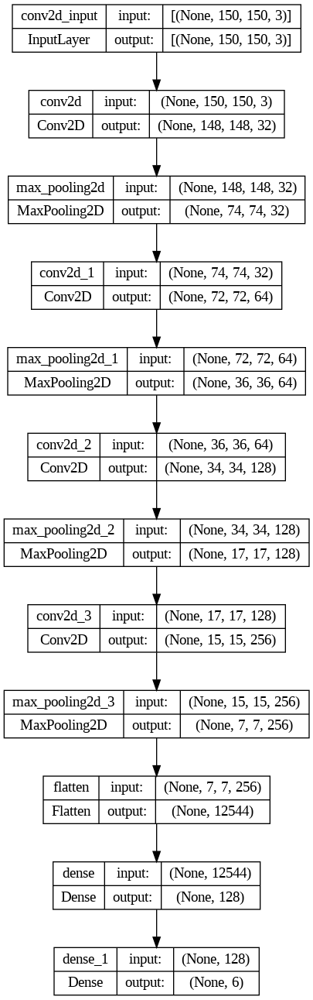

In [28]:
plot_model(cnn_model, 'cnn_model.png', show_shapes=True)

In [29]:
cnn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 74, 74, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 36, 36, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 17, 17, 128)       0

##### Model Training

In [61]:
cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

loss_stop = EarlyStopping(monitor='val_loss', patience=4, mode='min', verbose=1)
accuracy_stop = EarlyStopping(monitor='val_accuracy', patience=2)

start_time = time.time()
history_cnn_model = cnn_model.fit(train_data,
                batch_size=batch_size,
                epochs=10,
                validation_data=test_data,
                callbacks=[accuracy_stop, loss_stop])
end_time = time.time()

Epoch 1/10
220/220 [==============================] - 85s 379ms/step - loss: 0.5249 - accuracy: 0.8087 - val_loss: 0.5535 - val_accuracy: 0.8007
Epoch 2/10
220/220 [==============================] - 83s 377ms/step - loss: 0.4897 - accuracy: 0.8236 - val_loss: 0.4795 - val_accuracy: 0.8333
Epoch 3/10
220/220 [==============================] - 82s 372ms/step - loss: 0.4404 - accuracy: 0.8425 - val_loss: 0.4782 - val_accuracy: 0.8317
Epoch 4/10
220/220 [==============================] - 83s 375ms/step - loss: 0.4265 - accuracy: 0.8475 - val_loss: 0.4428 - val_accuracy: 0.8477
Epoch 5/10
220/220 [==============================] - 83s 377ms/step - loss: 0.4140 - accuracy: 0.8516 - val_loss: 0.4913 - val_accuracy: 0.8263
Epoch 6/10
220/220 [==============================] - 83s 375ms/step - loss: 0.3782 - accuracy: 0.8641 - val_loss: 0.4550 - val_accuracy: 0.8383


In [62]:
print("Elapsed time: {:.2f} hours" .format((end_time - start_time) / 3600))

Elapsed time: 0.14 hours


##### Model Evaluation

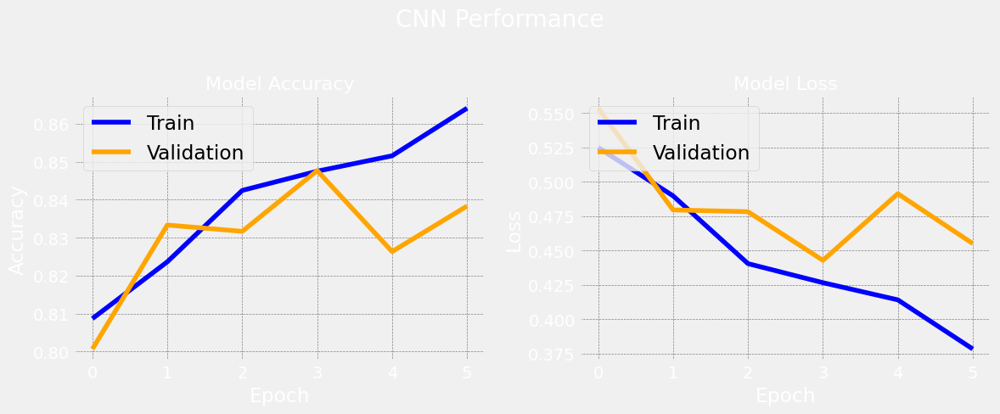

In [63]:
evaluate_model(history_cnn_model, cnn_model, 'CNN')

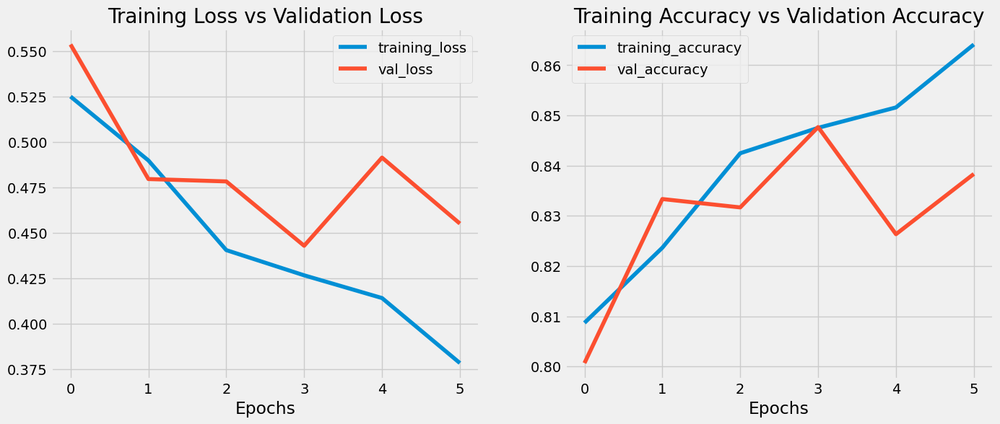

In [64]:
# Let's plot the loss curves
plot_loss_curves(history_cnn_model)

##### Model Prediction

94/94 [==============================] - 1s 5ms/step


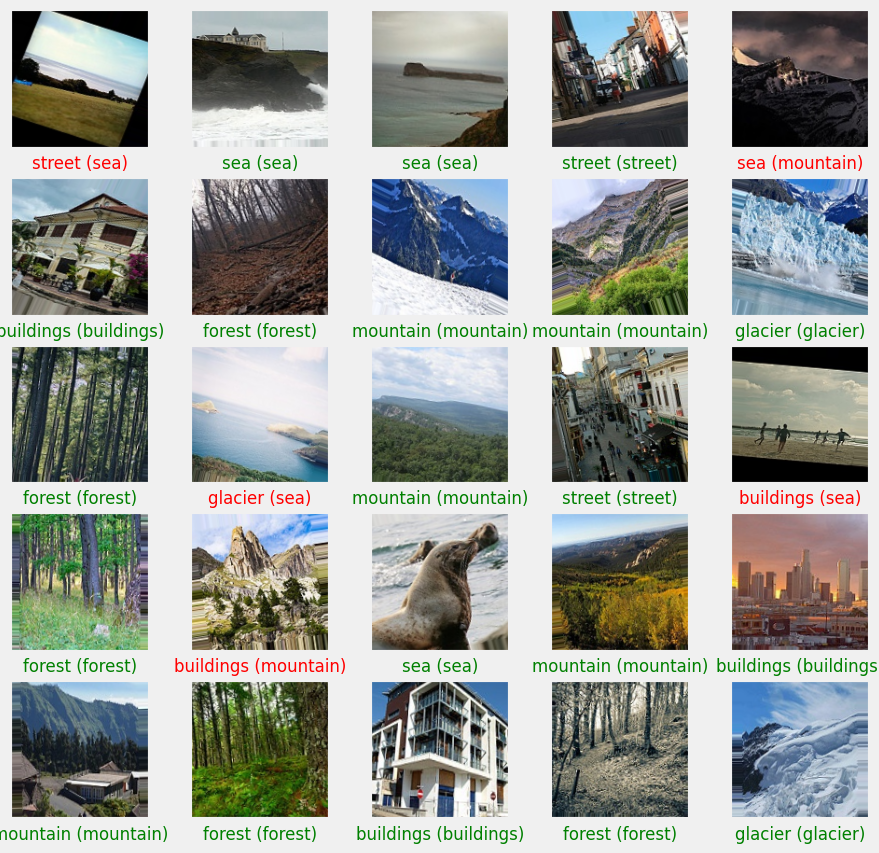

In [65]:
# First, get predictions for test images
cnn_model_predicted_scores = cnn_model.predict(test_images)
cnn_model_predicted_labels = np.argmax(cnn_model_predicted_scores, axis=1)

# Select 25 random image indices from the test set
random_indices = np.random.choice(len(test_images), size=25, replace=False)

plt.figure(figsize=(10,10))
for idx, random_index in enumerate(random_indices):
    plt.subplot(5,5,idx+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images[random_index])
    predicted_label = index_to_label[cnn_model_predicted_labels[random_index]]
    true_label = index_to_label[np.argmax(test_labels[random_index])]

    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'
    plt.xlabel(f"{predicted_label} ({true_label})", color=color, fontsize=12)
plt.show()

CNN Confusion Matrix

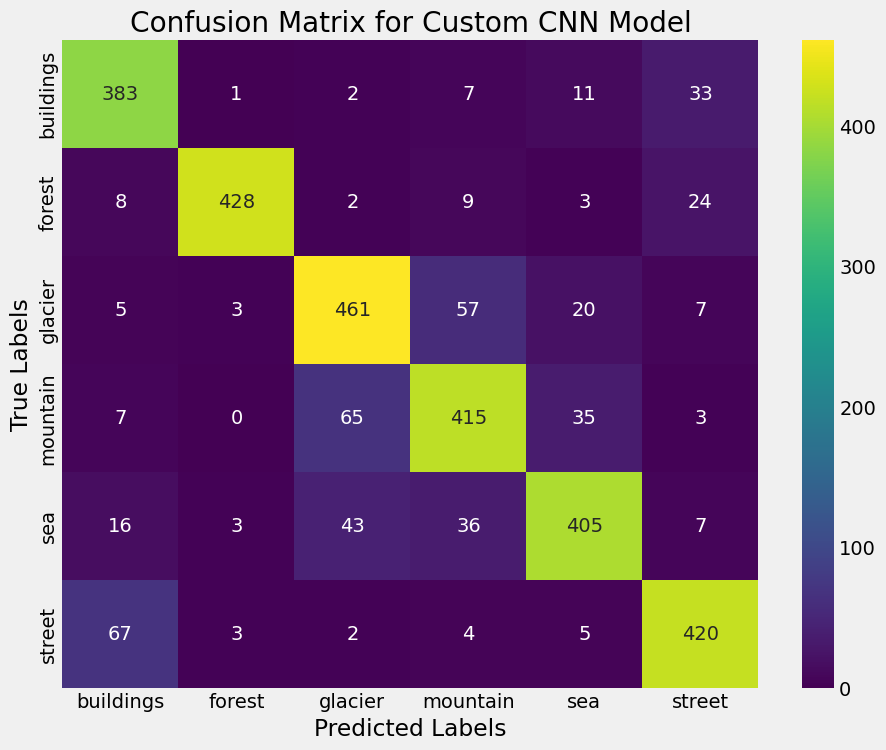

In [66]:
# Convert predicted labels from one-hot encoded format to categorical
cnn_model_predicted_labels_categorical = np.argmax(cnn_model_predicted_scores, axis=1)

# Generate the confusion matrix
conf_matrix = confusion_matrix(np.argmax(test_labels, axis=1), cnn_model_predicted_labels_categorical)


# Plot the confusion matrix using a heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
            xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
            yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
plt.title('Confusion Matrix for Custom CNN Model')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

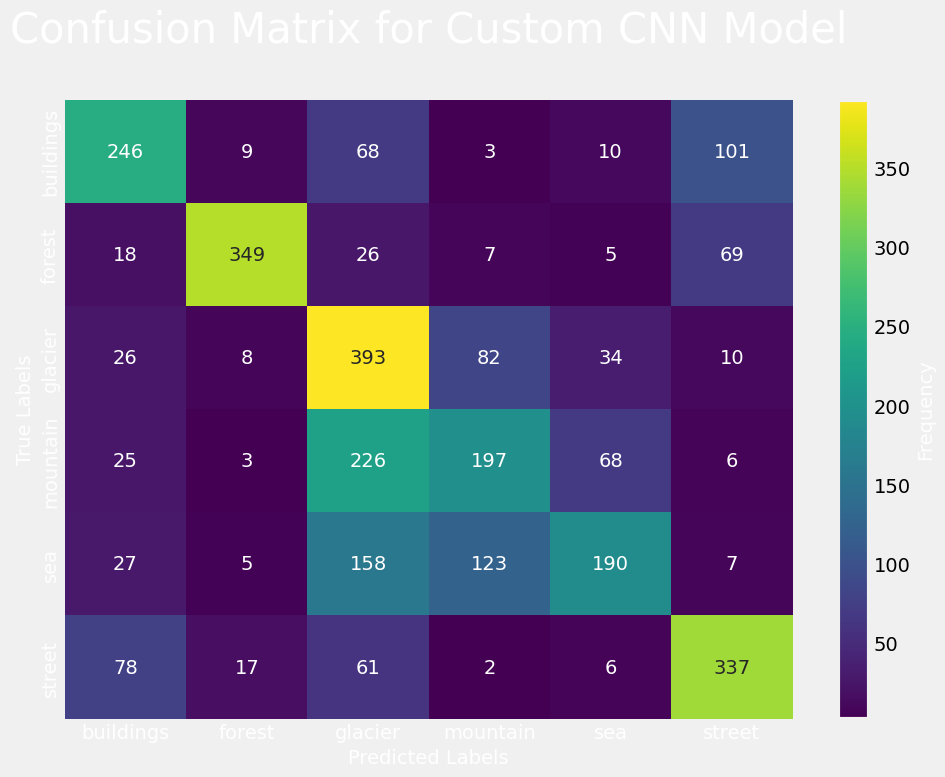

In [113]:
# plt.figure(figsize=(10, 8))
# sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
#                 xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
#                 yticklabels=[index_to_label[i] for i in range(len(index_to_label))],
#                 cbar=False)
# plt.title('Confusion Matrix for Custom CNN Model\n', color='white', fontsize=30)
# plt.ylabel('True Labels', color='white', fontsize=14)
# plt.xlabel('Predicted Labels', color='white', fontsize=14)
# plt.xticks(color='white')
# plt.yticks(color='white')
# plt.tight_layout()
# plt.savefig(f'cnn_confusion_matrix.png', transparent=True)
# plt.show()
# Your existing code for confusion matrix visualization

plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='viridis',
                      xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                      yticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                      cbar=False)
plt.title('Confusion Matrix for Custom CNN Model\n', color='white', fontsize=30)
plt.ylabel('True Labels', color='white', fontsize=14)
plt.xlabel('Predicted Labels', color='white', fontsize=14)
plt.xticks(color='white')
plt.yticks(color='white')

# Add a colorbar legend
cbar = plt.colorbar(heatmap.collections[0], ax=heatmap)
cbar.ax.set_ylabel('Frequency', fontsize=14)  # Setting the label text first
cbar.ax.yaxis.set_tick_params(color='white')  # Set color of colorbar tick labels
cbar.ax.yaxis.label.set_color('white')  # Set color of colorbar label text

plt.tight_layout()
plt.savefig(f'cnn_confusion_matrix.png', transparent=True)
plt.show()



### 2. EfficientNetB0


EfficientNet’s layers are based on a compound scaling method that uniformly scales the depth, width, and resolution of the network, with the stem layer being the initial part of the network that performs initial convolutions to process the input image before deeper layers.

# EfficientNetB0 v2

Creating the Callbacks & Data Augmentation Layer

<p style ="font-size:15px; font-family:verdana; line-weight: 1.7em">The images of the model will be subjected to a pre-trained CNN model called EfficientNetB0 and two callbacks will be utilized to monitor the training. The checkpoints are: Model Checkpoint, Tensorboard Callback. Also a Data Augmentation layer will be created and will be added right into the model. </p>
<p style ="font-size:15px; font-family:verdana; line-weight: 1.7em">You may see the hyperparameters of the model below:</p>

**Batch Size:** 32

**Epochs:** 10

**Input Shape:** (150, 150, 3)

**Output Layer:** 6

In [67]:
# Create the Tensorboard callback
def create_tensorboard_callback(dir_name, experiment_name):
    log_dir = dir_name + "/" + experiment_name + "/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
    log_dir=log_dir)
    print(f"Saving TensorBoard log files to: {log_dir}")
    return tensorboard_callback

In [68]:
# Create the data augmentation layer
data_augmentation_efficientnetb0 = Sequential([
    preprocessing.RandomFlip('horizontal'),
    preprocessing.RandomRotation(0.2),
    preprocessing.RandomHeight(0.2),
    preprocessing.RandomWidth(0.2),
    preprocessing.RandomZoom(0.2),
])

In [69]:
# Create the checkpoint path
checkpoint_path = 'efficientnetb0_model/checkpoint.ckpt'
checkpoint_callback = ModelCheckpoint(checkpoint_path,
                                      save_weights_only=True,
                                      monitor="val_accuracy",
                                      save_best_only=True)

Training the EfficientNetB0 Model

In [70]:
# Create the base model and freeze its layers
base_model_efficientnetb0 = tf.keras.applications.EfficientNetB0(include_top = False)
base_model_efficientnetb0.trainable = False

# Create the model architecture with trainable top layers
inputs = layers.Input(shape = (150, 150, 3), name = 'input_layer')

# Add the data augmentation layer
x = data_augmentation_efficientnetb0(inputs)
x = base_model_efficientnetb0(x, training = False)
x = layers.GlobalAveragePooling2D(name = 'global_avg_pool_layer')(x)
outputs = layers.Dense(6, activation = 'softmax', name = 'output_layer')(x)
efficientnetb0_model = tf.keras.Model(inputs, outputs)

# Compile the model
efficientnetb0_model.compile(loss = tf.keras.losses.CategoricalCrossentropy(),
                                      optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0001),
                                      metrics = ['accuracy'])

# Fit the model
history_efficientnetb0_model = efficientnetb0_model.fit(
                                                                    train_data,
                                                                    epochs = 10,
                                                                    steps_per_epoch = len(train_data),
                                                                    validation_data = test_data,
                                                                    validation_steps = int(0.25 * len(test_data)),
                                                                    callbacks = [create_tensorboard_callback(dir_name = 'training_logs',
                                                                                                             experiment_name = 'efficientnetb0_model'),
                                                                                checkpoint_callback])

Saving TensorBoard log files to: training_logs/efficientnetb0_model/20240317-185550
Epoch 1/10
220/220 [==============================] - 84s 350ms/step - loss: 1.7937 - accuracy: 0.1728 - val_loss: 1.7938 - val_accuracy: 0.1577
Epoch 2/10
220/220 [==============================] - 73s 333ms/step - loss: 1.7921 - accuracy: 0.1782 - val_loss: 1.7833 - val_accuracy: 0.1790
Epoch 3/10
220/220 [==============================] - 73s 334ms/step - loss: 1.7926 - accuracy: 0.1751 - val_loss: 1.7949 - val_accuracy: 0.1832
Epoch 4/10
220/220 [==============================] - 75s 342ms/step - loss: 1.7922 - accuracy: 0.1761 - val_loss: 1.7894 - val_accuracy: 0.1847
Epoch 5/10
220/220 [==============================] - 74s 337ms/step - loss: 1.7916 - accuracy: 0.1785 - val_loss: 1.7831 - val_accuracy: 0.1847
Epoch 6/10
220/220 [==============================] - 73s 333ms/step - loss: 1.7917 - accuracy: 0.1732 - val_loss: 1.7884 - val_accuracy: 0.1761
Epoch 7/10
220/220 [==========================

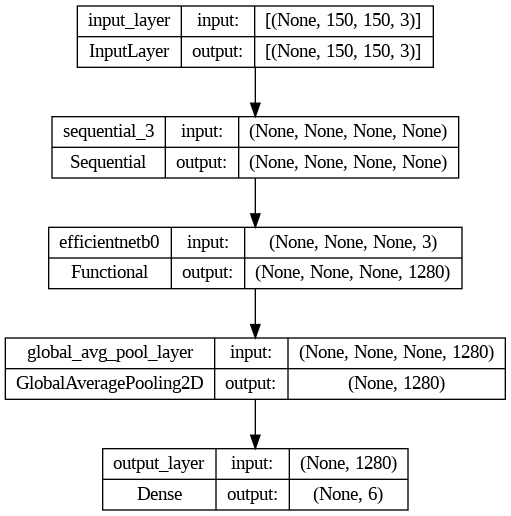

In [71]:
plot_model(efficientnetb0_model, 'efficientnetb0_model.png', show_shapes=True)

 Model Evaluation
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The test dataset will be used to evaluate the performance of the model. One of the metrics that will be tested would be accuracy which measures the fraction of predictions the model got right. Other metrics are as follows:   </p>

<h3>Precision(P):</h3>
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The fraction of true positives (TP, correct predictions) from the total amount of relevant results, i.e., the sum of TP and false positives (FP). For multi-class classification problems, P is averaged among the classes. The following is the formula for precision.</p>

<h4> <center>$P=TP/(TP+FP)$</center></h4>

<h3>Recall(R): </h3>
<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The fraction of TP from the total amount of TP and false negatives (FN). For multi-class classification problems, R gets averaged among all the classes. The following is the formula for recall.</p>
<h4><center>$R=TP/(TP+FN)$</center></h4>

<h3>F1 score(F1): </h3>

<p style="font-size:15px; font-family:verdana; line-height: 1.7em">The harmonic mean of precision and recall. For multi-class classification problems, F1 gets averaged among all the classes. The following is the formula for F1 score.</p>
<h4><center>$F1=2 * (TP * FP)/(TP+FP)$</center></h4>


In [72]:
# Evaluate our model on the whole test data
efficientnetb0_model_results = efficientnetb0_model.evaluate(test_data, verbose = 0)
print("Validation Loss: : {:.3f}, Validation Accuracy: {:.3f}".format(efficientnetb0_model_results[0], efficientnetb0_model_results[1]))

Validation Loss: : 1.787, Validation Accuracy: 0.184


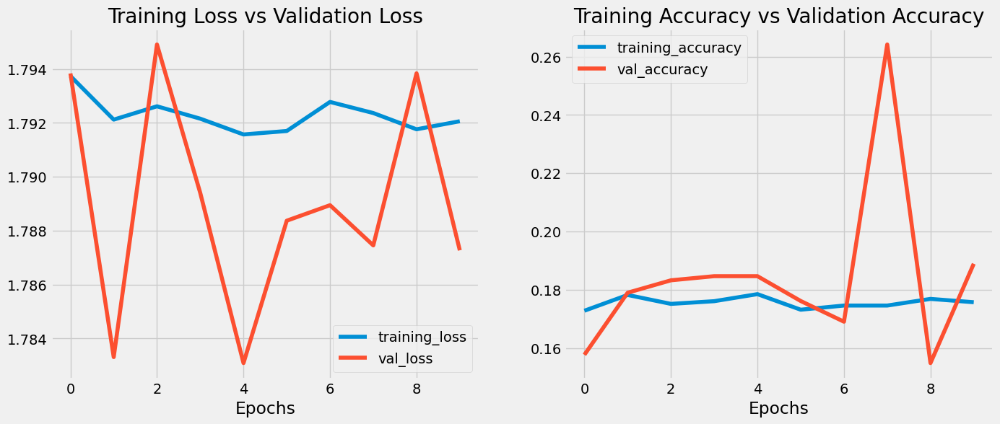

In [73]:
# Let's plot the loss curves
plot_loss_curves(history_efficientnetb0_model)

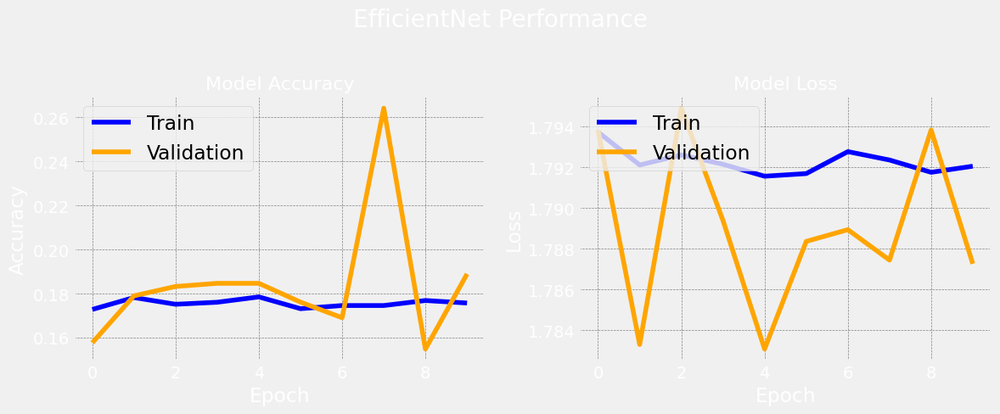

In [90]:
evaluate_model(history_efficientnetb0_model, efficientnetb0_model, 'EfficientNet')

Making predictions on the test data

1/1 [==============================] - 0s 28ms/step


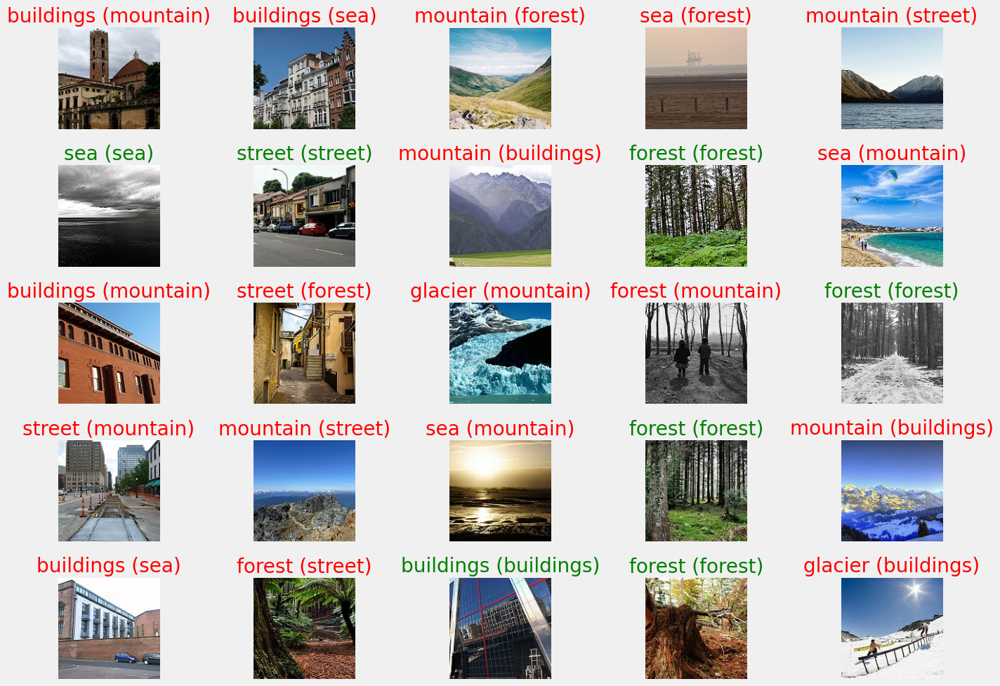

In [75]:
plt.figure(figsize=(15, 10))  # Set the figure size to accommodate a 5x5 grid

for i in range(25):  # Iterate to display 25 images
    # Choose random image(s) from random class(es)
    class_name = random.choice(classes)
    filename = random.choice(os.listdir(os.path.join(test_folder, class_name)))
    filepath = os.path.join(test_folder, class_name, filename)

    # Load the image and make predictions
    img = load_and_prep_image(filepath, scale=False)
    pred_prob = efficientnetb0_model.predict(tf.expand_dims(img, axis=0))
    pred_class = classes[pred_prob.argmax()]

    # Plot the image(s) on a 5x5 grid
    plt.subplot(5, 5, i+1)  # Create subplots with 5 rows and 5 columns
    plt.imshow(img/255.)
    if class_name == pred_class:
        title_color = 'green'
    else:
        title_color = 'red'
    plt.title(f'{class_name} ({pred_class})', c=title_color)
    plt.axis(False)

plt.tight_layout()  # Adjust layout to prevent overlapping
plt.show()

Analyzing the classification reports & Plotting the confusion matrix

In [76]:
# Make a couple of preparations
yLabels = []
for images, labels in test_data_1.unbatch():
    yLabels.append(labels.numpy().argmax())

predProbs = efficientnetb0_model.predict(test_data_1)
predClasses = predProbs.argmax(axis = 1)

# Check the classification reports by printing it out
print(classification_report(y_true = yLabels, y_pred = predClasses))

47/47 [==============================] - 3s 24ms/step
              precision    recall  f1-score   support

           0       0.03      0.03      0.03       437
           1       0.53      0.81      0.64       474
           2       0.01      0.00      0.01       553
           3       0.09      0.15      0.11       525
           4       0.13      0.10      0.11       510
           5       0.10      0.07      0.08       501

    accuracy                           0.19      3000
   macro avg       0.15      0.20      0.16      3000
weighted avg       0.15      0.19      0.16      3000



In [77]:
# Get a dataframe of the classification report
classification_report_df = pd.DataFrame(dict(classification_report(yLabels, predClasses, output_dict = True)))
classification_report_df.T

,precision,recall,f1-score,support
0,0.027985,0.034325,0.030832,437.000000
1,0.529492,0.814346,0.641729,474.000000
2,0.014925,0.003617,0.005822,553.000000
3,0.091220,0.152381,0.114123,525.000000
4,0.130548,0.098039,0.111982,510.000000
5,0.102639,0.069860,0.083135,501.000000
accuracy,0.189333,0.189333,0.189333,0.189333
macro avg,0.149468,0.195428,0.164604,3000.000000
weighted avg,0.145785,0.189333,0.159850,3000.000000


94/94 [==============================] - 1s 13ms/step


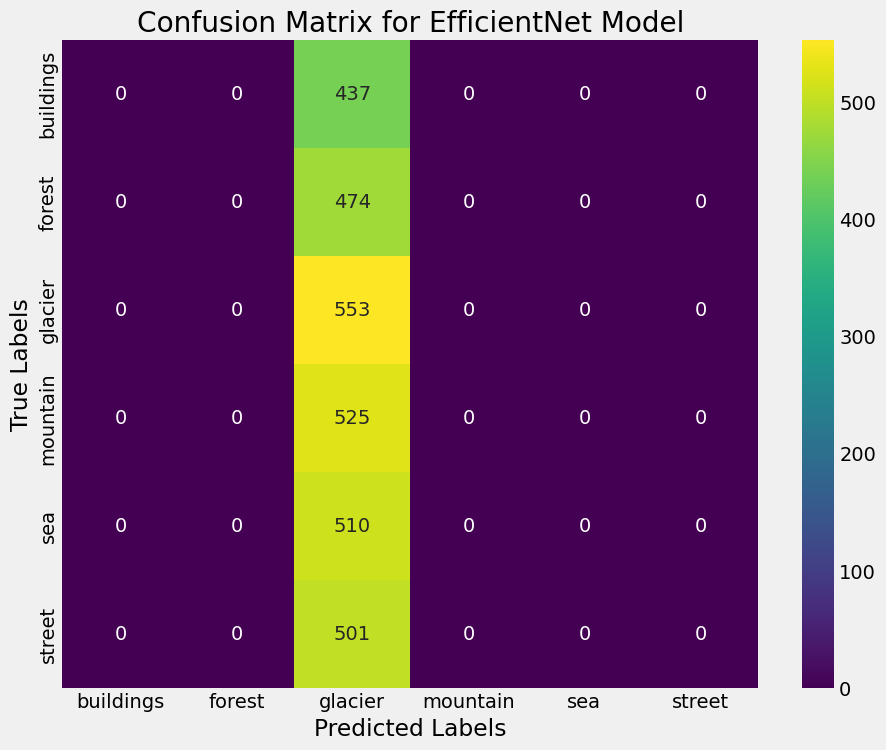

In [78]:
efficientnetb0_model_predicted_scores = efficientnetb0_model.predict(test_images)
efficientnetb0_model_predicted_labels = np.argmax(efficientnetb0_model_predicted_scores, axis=1)

# Convert predicted labels from one-hot encoded format to categorical

efficientnetb0_model_predicted_labels_categorical = np.argmax(efficientnetb0_model_predicted_scores, axis=1)

# Generate the confusion matrix
efficientnetb0_conf_matrix = confusion_matrix(np.argmax(test_labels, axis=1), efficientnetb0_model_predicted_labels_categorical)


# Plot the confusion matrix using a heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(efficientnetb0_conf_matrix, annot=True, fmt='d', cmap='viridis',
            xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
            yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
plt.title('Confusion Matrix for EfficientNet Model')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

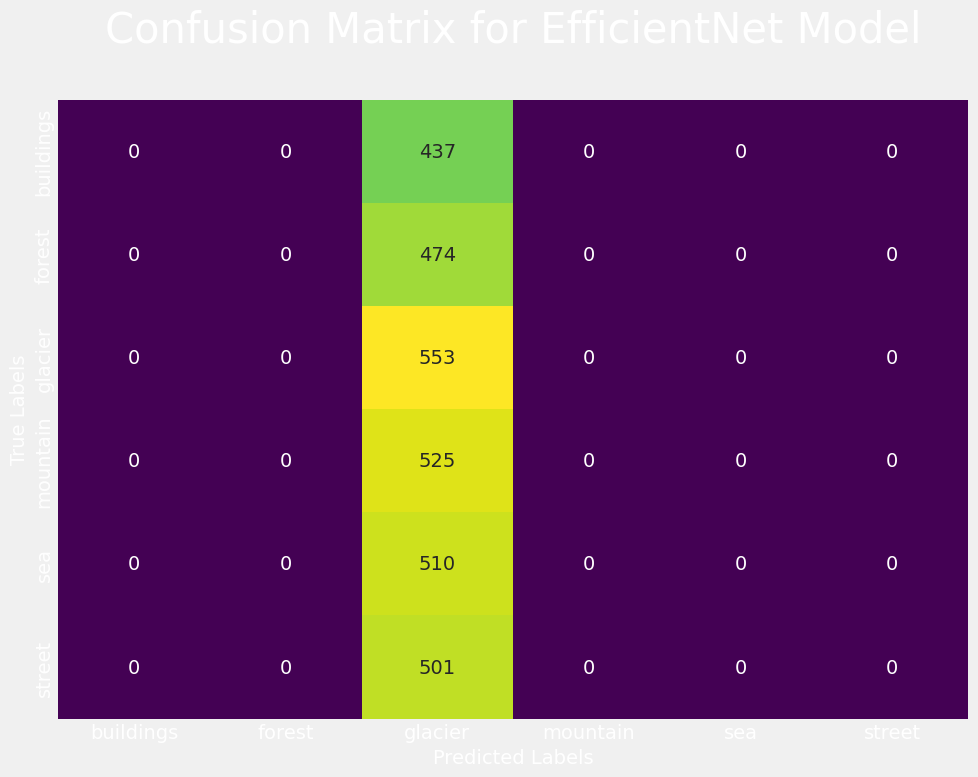

In [109]:
# plt.figure(figsize=(10, 8))
# sns.heatmap(efficientnetb0_conf_matrix, annot=True, fmt='d', cmap='viridis',
#                 xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
#                 yticklabels=[index_to_label[i] for i in range(len(index_to_label))],
#                 cbar=False)
# plt.title(f'Confusion Matrix for EfficientNet Model\n', color='white', fontsize=30)
# plt.ylabel('True Labels', color='white', fontsize=14)
# plt.xlabel('Predicted Labels', color='white', fontsize=14)
# plt.xticks(color='white')
# plt.yticks(color='white')
# plt.tight_layout()
# plt.savefig(f'efficient_confusion_matrix.png', transparent=True)
# plt.show()

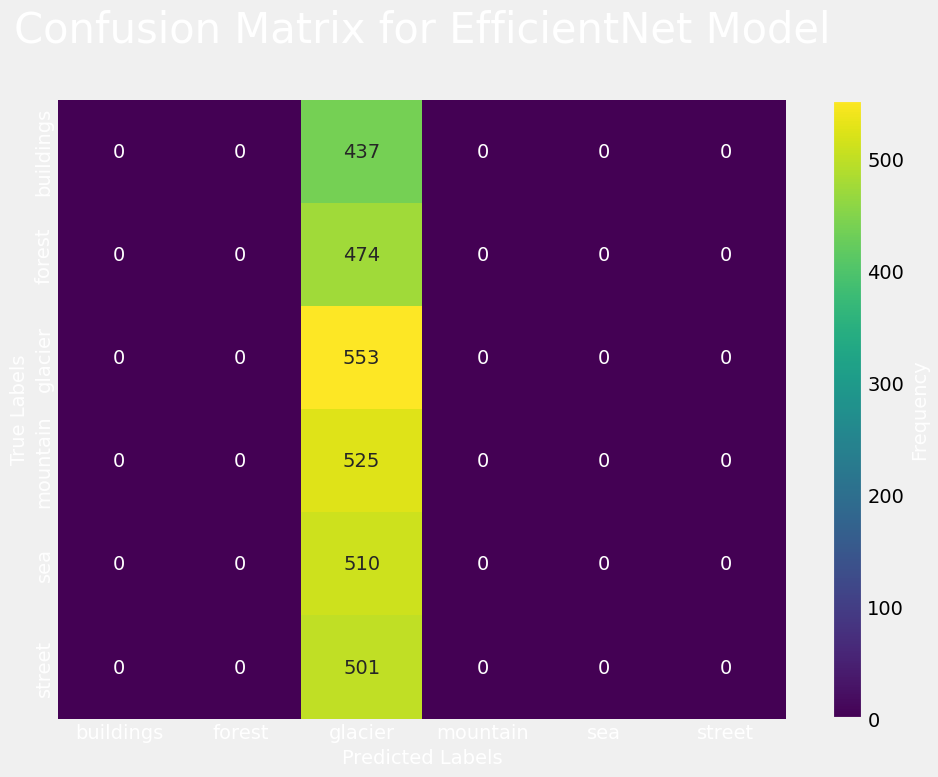

In [111]:
# Your existing code for confusion matrix visualization

plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(efficientnetb0_conf_matrix, annot=True, fmt='d', cmap='viridis',
                      xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                      yticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                      cbar=False)
plt.title('Confusion Matrix for EfficientNet Model\n', color='white', fontsize=30)
plt.ylabel('True Labels', color='white', fontsize=14)
plt.xlabel('Predicted Labels', color='white', fontsize=14)
plt.xticks(color='white')
plt.yticks(color='white')

# Add a colorbar legend
cbar = plt.colorbar(heatmap.collections[0], ax=heatmap)
cbar.ax.set_ylabel('Frequency', fontsize=14)  # Setting the label text first
cbar.ax.yaxis.set_tick_params(color='white')  # Set color of colorbar tick labels
cbar.ax.yaxis.label.set_color('white')  # Set color of colorbar label text

plt.tight_layout()
plt.savefig(f'efficientnetb0_conf_matrix.png', transparent=True)
plt.show()


Find the most Wrong predictions

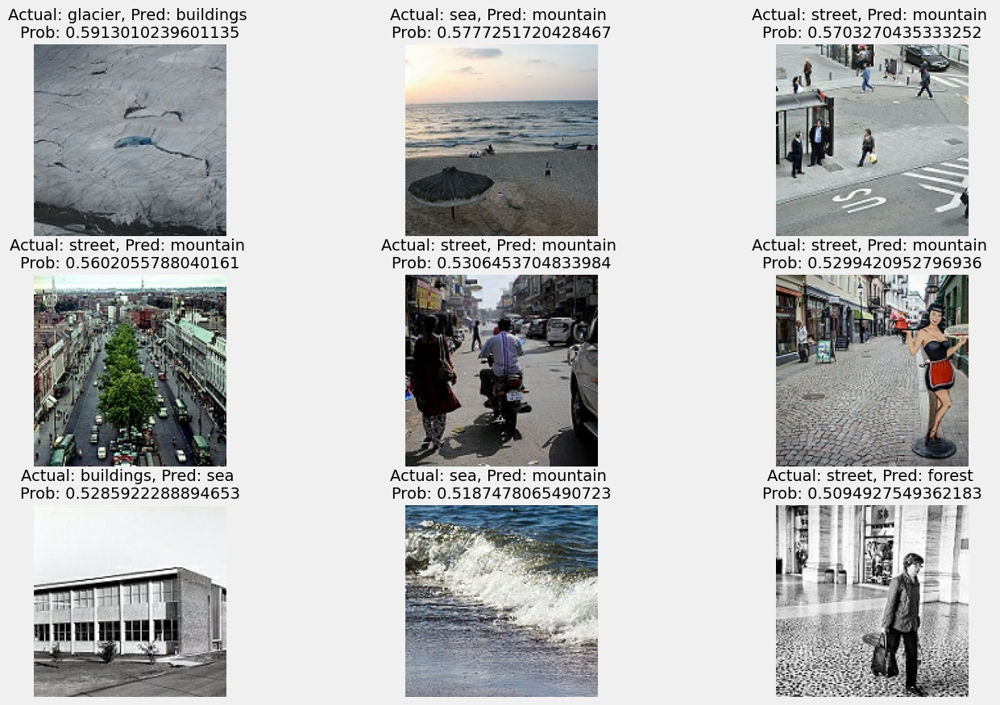

In [79]:
# Get all of the image file paths in the test dataset
filepaths = []
for filepath in test_data_1.list_files('./seg_test/seg_test/*/*.jpg', shuffle = False):
    filepaths.append(filepath.numpy())

# Create a DataFrame of different parameters for each of our test images
import pandas as pd
pred_df = pd.DataFrame({'img_path': filepaths,
                        'y_true': yLabels,
                        'y_pred': predClasses,
                        'pred_conf': predProbs.max(axis = 1),
                        'y_true_classname': [classes[i] for i in yLabels],
                        'y_pred_classname': [classes[i] for i in predClasses]})

# Find out in our DataFrame which predictions are wrong
pred_df['pred_correct'] = pred_df['y_true'] == pred_df['y_pred']

# Sort our DataFrame to have most wrong predictions at the top
top_100_wrong = pred_df[pred_df['pred_correct'] == False].sort_values('pred_conf', ascending = False)[:100]

# Visualize the test data samples which have the wrong prediction but highest prediction probability
images_to_view = 9
start_index = 0
plt.figure(figsize = (15, 10))
for i, row in enumerate(top_100_wrong[start_index: start_index + images_to_view].itertuples()):
    plt.subplot(3, 3, i + 1)
    img = load_and_prep_image(row[1], scale = False)
    _, _, _, _, pred_prob, y_true_classname, y_pred_classname, _ = row
    plt.imshow(img/255.)
    plt.title(f'Actual: {y_true_classname}, Pred: {y_pred_classname} \nProb: {pred_prob}', fontsize=14)
    plt.axis(False)

### 3. ResNet50


ResNet50 is part of the ResNet (Residual Network) family of models, which are known for their deep architectures and the use of residual connections. These residual connections help address the vanishing gradient problem, allowing for the training of very deep networks more effectively.

In [80]:
# Load pre-trained ResNet model
resnet_base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(150, 150, 3))

# Freeze the base model
resnet_base_model.trainable = False

# Create the sequential model
resnet50_model = tf.keras.Sequential([
    resnet_base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    tf.keras.layers.Dense(1024, activation='relu'),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Dense(n_classes, activation='softmax')
])

# Compile the model
resnet50_model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Print model summary
resnet50_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 5, 5, 2048)        23587712  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_4 (Dense)             (None, 1024)              2098176   
                                                                 
 dropout_1 (Dropout)         (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 6)                 6150      
                                                                 
Total params: 25692038 (98.01 MB)
Trainable params: 2104326 (8.03 MB)
Non-trainable params: 23587712 (89.98 MB)
________

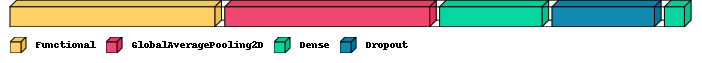

In [81]:
visualkeras.layered_view(resnet50_model,legend=True)

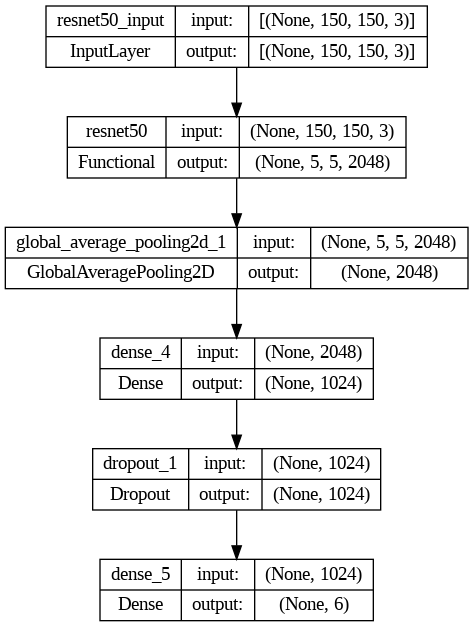

In [82]:
plot_model(resnet50_model, 'resnet50_model.png', show_shapes=True)

94/94 [==============================] - 3s 19ms/step


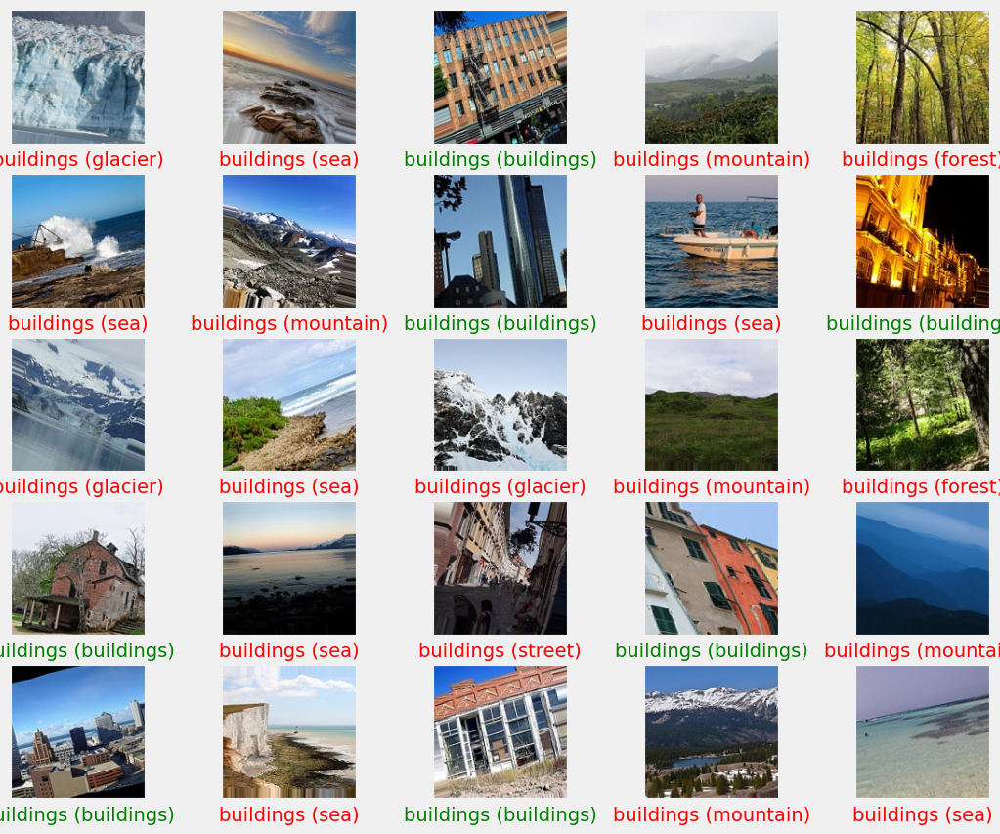

In [83]:
# First, get predictions for validation images
resnet_predicted_scores = resnet50_model.predict(test_images)
resnet_predicted_labels = np.argmax(resnet_predicted_scores, axis=1)

# Convert numerical labels back to class names
index_to_label = {index: label for label, index in label_to_index.items()}

# Select 25 random image indices from the test set
random_indices = np.random.choice(len(test_images), size=25, replace=False)

plt.figure(figsize=(12,10))
for idx, random_index in enumerate(random_indices):
    plt.subplot(5,5,idx+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(test_images[random_index])
    predicted_label = index_to_label[resnet_predicted_labels[random_index]]
    true_label = index_to_label[np.argmax(test_labels[random_index])]

    if predicted_label == true_label:
        color = 'green'
    else:
        color = 'red'
    plt.xlabel(f"{predicted_label} ({true_label})", color=color, fontsize=14)
plt.show()


In [84]:
# min means we want to 'minimize' the loss
loss_stop = EarlyStopping(monitor='val_loss', patience=2, mode='min', verbose=1)
accuracy_stop = EarlyStopping(monitor='val_accuracy', patience=2)

start_time = time.time()
resnet50_history = resnet50_model.fit(train_data,
                                epochs=10,
                                validation_data=test_data,
                                callbacks=[accuracy_stop, loss_stop])
end_time = time.time()
enet_time = end_time - start_time

Epoch 1/10
220/220 [==============================] - 89s 388ms/step - loss: 1.5758 - accuracy: 0.3330 - val_loss: 1.3755 - val_accuracy: 0.4430
Epoch 2/10
220/220 [==============================] - 86s 391ms/step - loss: 1.3628 - accuracy: 0.4285 - val_loss: 1.2727 - val_accuracy: 0.4817
Epoch 3/10
220/220 [==============================] - 86s 390ms/step - loss: 1.3014 - accuracy: 0.4518 - val_loss: 1.2230 - val_accuracy: 0.4907
Epoch 4/10
220/220 [==============================] - 85s 386ms/step - loss: 1.2430 - accuracy: 0.4833 - val_loss: 1.1755 - val_accuracy: 0.5240
Epoch 5/10
220/220 [==============================] - 87s 396ms/step - loss: 1.2108 - accuracy: 0.4974 - val_loss: 1.1471 - val_accuracy: 0.5463
Epoch 6/10
220/220 [==============================] - 84s 381ms/step - loss: 1.1901 - accuracy: 0.5066 - val_loss: 1.1347 - val_accuracy: 0.5553
Epoch 7/10
220/220 [==============================] - 84s 383ms/step - loss: 1.1686 - accuracy: 0.5206 - val_loss: 1.1461 - val_ac

Efficient Net - Execution time: 14 minutes


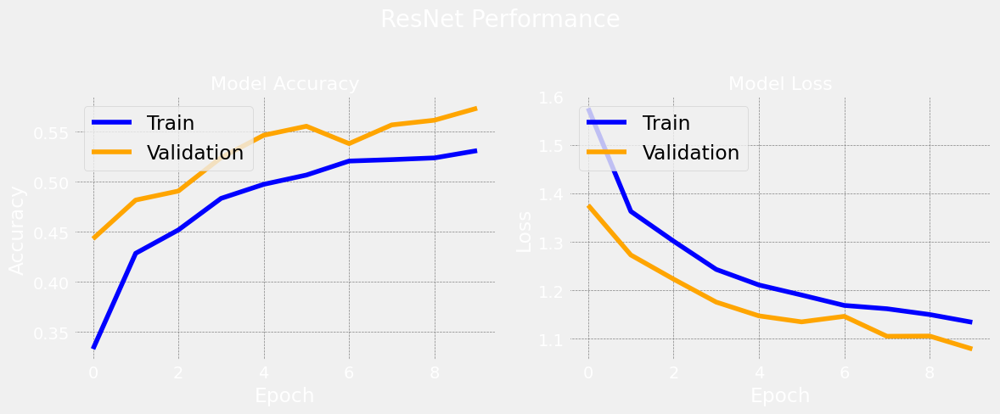

In [92]:
print(f"Efficient Net - Execution time: {round(enet_time / 60)} minutes")
evaluate_model(resnet50_history, resnet50_model, 'ResNet')

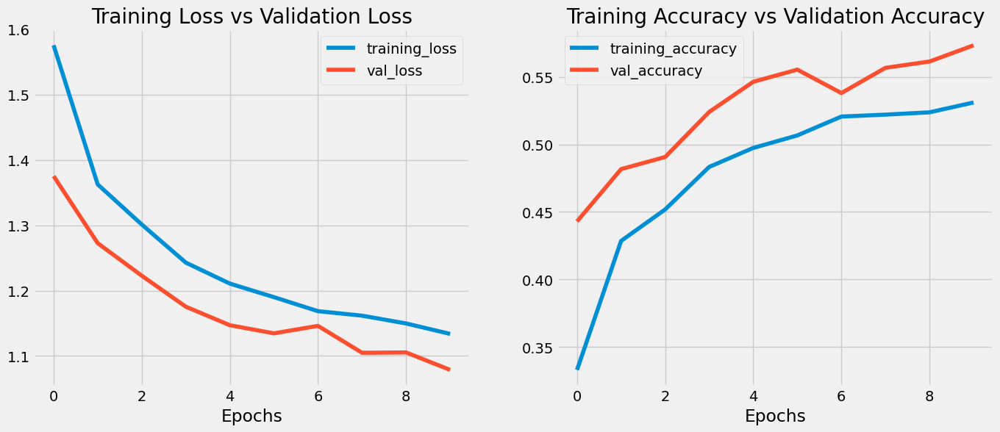

In [86]:
# Let's plot the loss curves
plot_loss_curves(resnet50_history)

In [87]:
# First, get predictions for test images
resnet50_model_predicted_scores = resnet50_model.predict(test_images)
resnet50_model_predicted_labels = np.argmax(resnet50_model_predicted_scores, axis=1)

94/94 [==============================] - 2s 19ms/step


In [94]:
# Convert predicted labels from one-hot encoded format to categorical labels
resnet50_model_predicted_labels_categorical = np.argmax(resnet50_model_predicted_scores, axis=1)

# Generate the confusion matrix
conf_matrix_resnet = confusion_matrix(np.argmax(test_labels, axis=1), resnet50_model_predicted_labels_categorical)


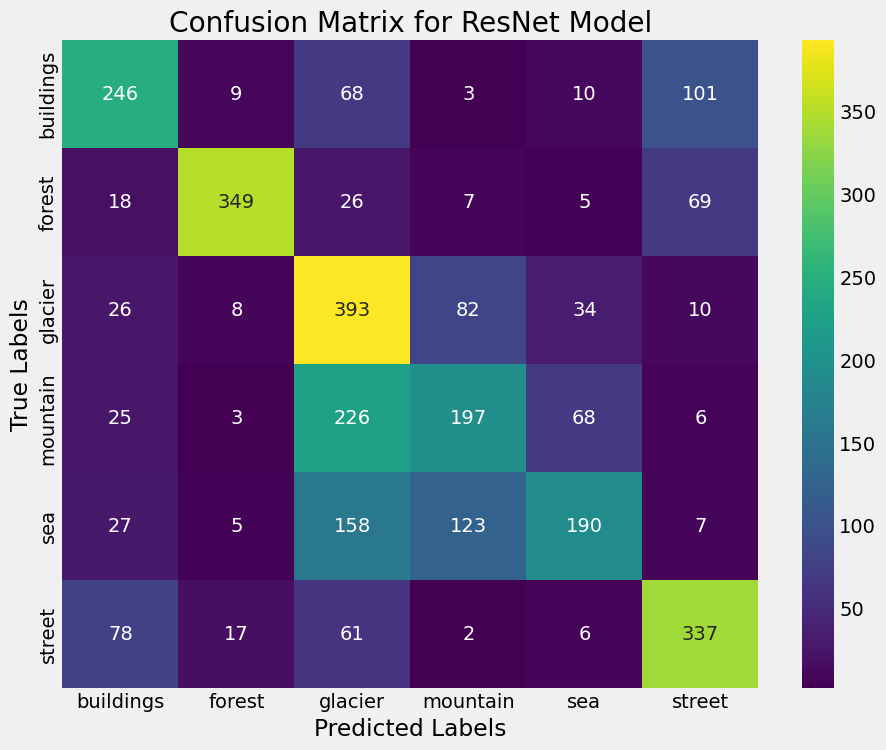

In [95]:

# Plot the confusion matrix using a heatmap.
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix_resnet, annot=True, fmt='d', cmap='viridis',
            xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
            yticklabels=[index_to_label[i] for i in range(len(index_to_label))])
plt.title('Confusion Matrix for ResNet Model')
plt.ylabel('True Labels')
plt.xlabel('Predicted Labels')
plt.show()

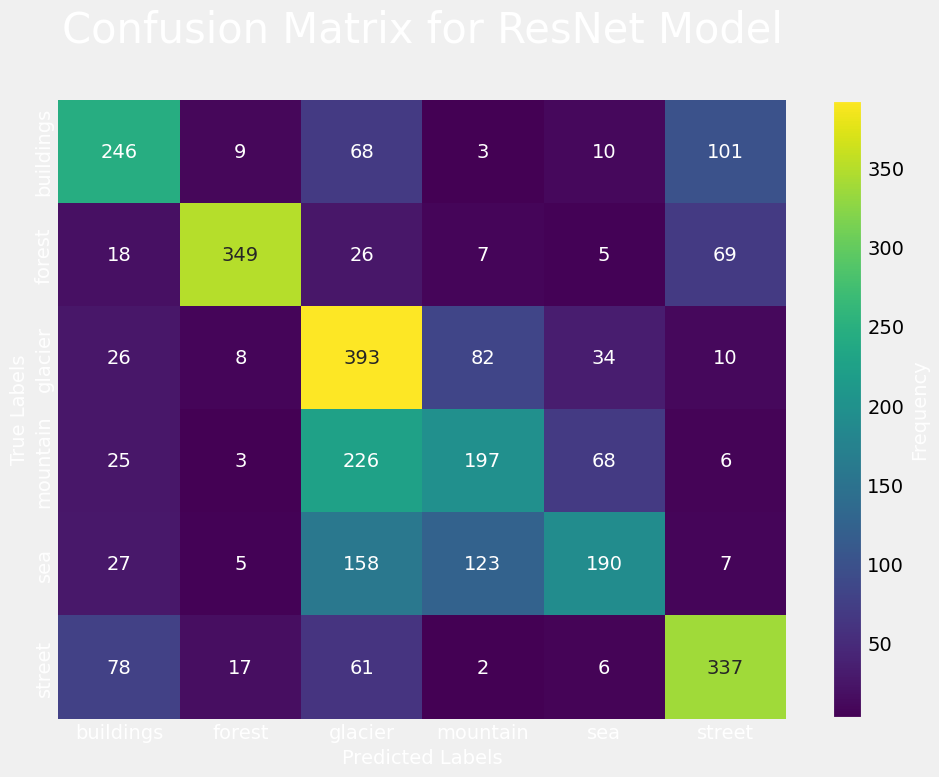

In [108]:
# Your existing code for confusion matrix visualization

plt.figure(figsize=(10, 8))
heatmap = sns.heatmap(conf_matrix_resnet, annot=True, fmt='d', cmap='viridis',
                      xticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                      yticklabels=[index_to_label[i] for i in range(len(index_to_label))],
                      cbar=False)
plt.title('Confusion Matrix for ResNet Model\n', color='white', fontsize=30)
plt.ylabel('True Labels', color='white', fontsize=14)
plt.xlabel('Predicted Labels', color='white', fontsize=14)
plt.xticks(color='white')
plt.yticks(color='white')

# Add a colorbar legend
cbar = plt.colorbar(heatmap.collections[0], ax=heatmap)
cbar.ax.set_ylabel('Frequency', fontsize=14)  # Setting the label text first
cbar.ax.yaxis.set_tick_params(color='white')  # Set color of colorbar tick labels
cbar.ax.yaxis.label.set_color('white')  # Set color of colorbar label text

plt.tight_layout()
plt.savefig(f'resnet_confusion_matrix.png', transparent=True)
plt.show()


# Models Evaluation

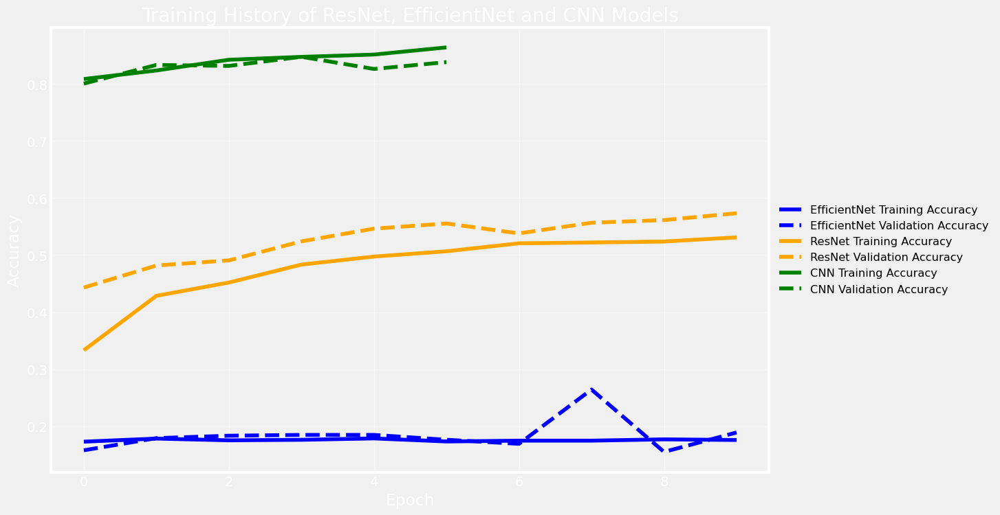

In [89]:
# Plot training history
plt.figure(figsize=(12, 8))  # Set figure size

plt.plot(history_efficientnetb0_model.history['accuracy'], label='EfficientNet Training Accuracy', color='#0000FF')
plt.plot(history_efficientnetb0_model.history['val_accuracy'], label='EfficientNet Validation Accuracy', linestyle='--', color='#0000FF')

plt.plot(resnet50_history.history['accuracy'], label='ResNet Training Accuracy', color='#FFA500')
plt.plot(resnet50_history.history['val_accuracy'], label='ResNet Validation Accuracy', linestyle='--', color='#FFA500')

plt.plot(history_cnn_model.history['accuracy'], label='CNN Training Accuracy', color='#008000')
plt.plot(history_cnn_model.history['val_accuracy'], label='CNN Validation Accuracy', linestyle='--', color='#008000')

plt.xlabel('Epoch', color='white')
plt.ylabel('Accuracy', color='white')
plt.title('Training History of ResNet, EfficientNet and CNN Models', color='white')
plt.legend(fontsize='small', edgecolor='none', loc='center left', bbox_to_anchor=(1, 0.5))
plt.grid(True, color='white', alpha=0.5)
plt.gca().set_facecolor('none')
plt.gca().spines['bottom'].set_color('white')
plt.gca().spines['top'].set_color('white')
plt.gca().spines['left'].set_color('white')
plt.gca().spines['right'].set_color('white')
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')
plt.savefig('training_history.png', transparent=True, bbox_inches='tight')
plt.show()